In [ ]:
import torch
import torchvision
from torchvision import datasets, models, transforms, utils
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import time
import os
import copy
from torch.autograd import Variable
from numba import cuda 
from google.colab import files
from google.colab import drive
from torch.utils.data import Dataset
import torch.utils.data as data
import glob
from PIL import Image
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
from matplotlib.pyplot import figure
from torch.utils.data.sampler import SubsetRandomSampler
import random
import torchvision.utils as vutils
import matplotlib.animation as animation
from IPython.display import HTML
from scipy import linalg
from torch.nn.functional import adaptive_avg_pool2d
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
from __future__ import print_function
import argparse
from scipy.interpolate import interp1d
from torch.optim import RMSprop

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cpu


In [ ]:
!git clone https://github.com/chenyuntc/pytorch-GAN.git

Cloning into 'pytorch-GAN'...
remote: Enumerating objects: 28, done.
remote: Total 28 (delta 0), reused 0 (delta 0), pack-reused 28
Unpacking objects: 100% (28/28), done.


In [ ]:
drive.mount('/content/drive')
zip_path = '/content/drive/MyDrive/lsun.zip'
!cp '{zip_path}' .
!unzip -q lsun.zip > nul
!rm lsun.zip

Mounted at /content/drive


#Util functions

In [ ]:
def conv_output_shape(h_w, kernel_size=1, stride=1, pad=0, dilation=1):
    """
    Utility function for computing output of convolutions
    takes a tuple of (h,w) and returns a tuple of (h,w)
    """
    
    from math import floor
    if type(kernel_size) is not tuple:
        kernel_size = (kernel_size, kernel_size)
    h = floor( ((h_w[0] + (2 * pad) - ( dilation * (kernel_size[0] - 1) ) - 1 )/ stride) + 1)
    w = floor( ((h_w[1] + (2 * pad) - ( dilation * (kernel_size[1] - 1) ) - 1 )/ stride) + 1)
    return h, w

def convtransp_output_shape(h_w, kernel_size=1, stride=1, pad=0, dilation=1):
    """
    Utility function for computing output of transposed convolutions
    takes a tuple of (h,w) and returns a tuple of (h,w)
    """
    
    if type(h_w) is not tuple:
        h_w = (h_w, h_w)
    
    if type(kernel_size) is not tuple:
        kernel_size = (kernel_size, kernel_size)
    
    if type(stride) is not tuple:
        stride = (stride, stride)
    
    if type(pad) is not tuple:
        pad = (pad, pad)
        
    h = (h_w[0] - 1) * stride[0] - 2 * pad[0] + kernel_size[0] + pad[0]
    w = (h_w[1] - 1) * stride[1] - 2 * pad[1] + kernel_size[1] + pad[1]
    
    return h, w

In [ ]:
convtransp_output_shape((8,8), 4,2,1)

(17, 17)

# Data

In [ ]:
class ImageDataset(Dataset):
    def __init__(self, folder_path, transform=None):
        """
        A dataset example where the class is embedded in the file names

        Args:
            folder_path (string): path to image folder
        """
        # Get image list
        self.image_list = glob.glob(folder_path+'/**/**/**/*')
        # Calculate len
        self.data_len = len(self.image_list)
        self.transform = transform

    def __getitem__(self, index):
        # Get image name from the pandas df
        single_image_path = self.image_list[index]
        label = os.path.basename(single_image_path)
        # Open image
        image = Image.open(single_image_path)
        if self.transform:
            image = self.transform(image)

        
        return image, label

    def __len__(self):
        return self.data_len

In [ ]:
 # Parameters
 train_input_root = './lsun/bedroom'
 batch_size = 128
 workers = 2

transform = transforms.Compose(
    [transforms.Resize((64,64)),
     transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

dataset = ImageDataset(
        folder_path=train_input_root,
        transform=transform)

validation_split = .2
shuffle_dataset = True
random_seed= 42

# Creating data indices for training and validation splits:
dataset_size = len(dataset)
indices = list(range(dataset_size))
split = int(np.floor(validation_split * dataset_size))
if shuffle_dataset :
    np.random.seed(random_seed)
    np.random.shuffle(indices)
train_indices, val_indices = indices[split:], indices[:split]

# Creating PT data samplers and loaders:
train_sampler = SubsetRandomSampler(train_indices)
valid_sampler = SubsetRandomSampler(val_indices)

train_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           sampler=train_sampler, num_workers=2)

val_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                                sampler=valid_sampler,
                                                num_workers=2)


# Checking the train dataset
for image, _ in train_loader:  
    print('Train image batch dimensions:', image.shape)
    break

# Checking the valid dataset
for image, _ in val_loader:  
    print('Validation image batch dimensions:', image.shape)
    break

Train image batch dimensions: torch.Size([128, 3, 64, 64])
Validation image batch dimensions: torch.Size([128, 3, 64, 64])


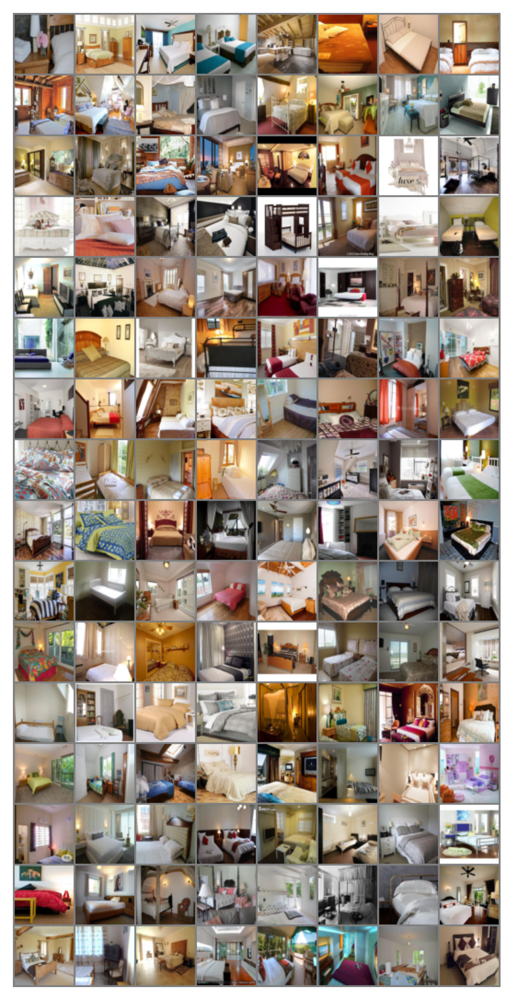

('300ae80a079ffd7283dfee03913dc5a808e5c7aa.jpg', '14797c27bb4dcef91f328c3d403de102834aaf27.jpg', '772ea61d54a56558aa106aaa4403d044f28b4366.jpg', '3f351f011141913837e96d3c48caf602ca8be631.jpg', 'cbf9ba4143a4cf5f2ab1f3d6aae61474b34acbf7.jpg', 'e4d909ec88af16bb8367d2e8566c471c372e54e5.jpg', '5d42f3ebdd83c150f250d51635ce6039cea26982.jpg', '6ada03f375df6025eb9db1e65212038a26a057f8.jpg', 'b82716b4a8365af5b43247e6d12e0a7adc8faded.jpg', '1a7b94f581f72b4290c1574aa270fb762237f280.jpg', '8e3616a3114442092a38658e35a6674cc5990b94.jpg', '2c1d06d19a695ad18bd19481607c491715de0af7.jpg', '929ea338b8a3dde15510cd76734098130304eeb1.jpg', '67ce1a209cf066a2c625bfcef5ca29c9367a4783.jpg', '75b129f577be705fa111f996c088aca9d4094c4f.jpg', 'd5eb8e738575f26cde39bc1255c611e3b249ec61.jpg', '069177d5201f54d5d7e181d1f6f8c5c1b7938af8.jpg', '46f2a8ca46d2cbe5a57163b6faee3250e29deb27.jpg', 'af4a7c0c69bde23f87ef4f92bbf6611983cf597e.jpg', '9ec8ee2a9683fb9fbcaba15b66f838974ee0536f.jpg', '6cc950fa60aba8f3c1d3702a9bf000cf2e51b2

In [ ]:
# functions to show an image
def imshow(img):
    plt.rcParams['figure.figsize'] = [10, 10]
    plt.rcParams['figure.dpi'] = 300
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.axis('off')
    plt.show()

# get some random training images
dataiter = iter(train_loader)
images, labels = dataiter.next()

# show images
imshow(torchvision.utils.make_grid(images))
print(labels)

# Experiments

## DCGAN

### Parameters

In [ ]:
# Source https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html and
# https://www.kaggle.com/ibtesama/gan-in-pytorch-with-fid

SEED=42
random.seed(SEED)
torch.manual_seed(SEED)
# Spatial size of training images. All images will be resized to this size using a transformer.
image_size = 64
# Number of channels in the training images. For color images this is 3
nc = 3
# Size of z latent vector (i.e. size of generator input)
nz = 100
# Size of feature maps in generator
ngf = 64
# Size of feature maps in discriminator
ndf = 64
# Number of training epochs
num_epochs = 100
# different Learning rate for optimizers
g_lr = 0.0001
d_lr = 0.0004
# Beta1 hyperparam for Adam optimizers
beta1 = 0.5
ngpu=1

### Generator

In [ ]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # added layer - state size. (ngf*2) x 16 x 16
            # nn.ConvTranspose2d( ngf, ngf, 4, 2, 1, bias=False),
            # nn.BatchNorm2d(ngf),
            # nn.ReLU(True),
            # added layer - state size. (ngf*2) x 16 x 16
            # nn.ConvTranspose2d( ngf, ngf, 4, 2, 1, bias=False),
            # nn.BatchNorm2d(ngf),
            # nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
# Create the generator
netG = Generator(ngpu).to(device)
netG.apply(weights_init)
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


## Discriminator

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # added layer (nc) x 256 x256
            # nn.Conv2d(nc, nc, 4, 4, 1, bias=False),
            # nn.LeakyReLU(0.2, inplace=True),
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)
# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)
# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


## Initialization

In [ ]:
# Initialize BCELoss function
criterion = nn.BCELoss()
# Establish convention for real and fake labels during training
# real_label = 1
# fake_label = 0
"""adding label smoothing"""
real_label=0.9
fake_label=0.1

# Setup Adam optimizers for both G and D

optimizerD = optim.Adam(netD.parameters(), lr=d_lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=g_lr, betas=(beta1, 0.999))

## FID

In [ ]:
class InceptionV3(nn.Module):
    """Pretrained InceptionV3 network returning feature maps"""

    # Index of default block of inception to return,
    # corresponds to output of final average pooling
    DEFAULT_BLOCK_INDEX = 3

    # Maps feature dimensionality to their output blocks indices
    BLOCK_INDEX_BY_DIM = {
        64: 0,   # First max pooling features
        192: 1,  # Second max pooling featurs
        768: 2,  # Pre-aux classifier features
        2048: 3  # Final average pooling features
    }

    def __init__(self,
                 output_blocks=[DEFAULT_BLOCK_INDEX],
                 resize_input=True,
                 normalize_input=True,
                 requires_grad=False):
        
        super(InceptionV3, self).__init__()

        self.resize_input = resize_input
        self.normalize_input = normalize_input
        self.output_blocks = sorted(output_blocks)
        self.last_needed_block = max(output_blocks)

        assert self.last_needed_block <= 3, \
            'Last possible output block index is 3'

        self.blocks = nn.ModuleList()

        
        inception = models.inception_v3(pretrained=True)

        # Block 0: input to maxpool1
        block0 = [
            inception.Conv2d_1a_3x3,
            inception.Conv2d_2a_3x3,
            inception.Conv2d_2b_3x3,
            nn.MaxPool2d(kernel_size=3, stride=2)
        ]
        self.blocks.append(nn.Sequential(*block0))

        # Block 1: maxpool1 to maxpool2
        if self.last_needed_block >= 1:
            block1 = [
                inception.Conv2d_3b_1x1,
                inception.Conv2d_4a_3x3,
                nn.MaxPool2d(kernel_size=3, stride=2)
            ]
            self.blocks.append(nn.Sequential(*block1))

        # Block 2: maxpool2 to aux classifier
        if self.last_needed_block >= 2:
            block2 = [
                inception.Mixed_5b,
                inception.Mixed_5c,
                inception.Mixed_5d,
                inception.Mixed_6a,
                inception.Mixed_6b,
                inception.Mixed_6c,
                inception.Mixed_6d,
                inception.Mixed_6e,
            ]
            self.blocks.append(nn.Sequential(*block2))

        # Block 3: aux classifier to final avgpool
        if self.last_needed_block >= 3:
            block3 = [
                inception.Mixed_7a,
                inception.Mixed_7b,
                inception.Mixed_7c,
                nn.AdaptiveAvgPool2d(output_size=(1, 1))
            ]
            self.blocks.append(nn.Sequential(*block3))

        for param in self.parameters():
            param.requires_grad = requires_grad

    def forward(self, inp):
        """Get Inception feature maps
        Parameters
        ----------
        inp : torch.autograd.Variable
            Input tensor of shape Bx3xHxW. Values are expected to be in
            range (0, 1)
        Returns
        -------
        List of torch.autograd.Variable, corresponding to the selected output
        block, sorted ascending by index
        """
        outp = []
        x = inp

        if self.resize_input:
            x = F.interpolate(x,
                              size=(299, 299),
                              mode='bilinear',
                              align_corners=False)

        if self.normalize_input:
            x = 2 * x - 1  # Scale from range (0, 1) to range (-1, 1)

        for idx, block in enumerate(self.blocks):
            x = block(x)
            if idx in self.output_blocks:
                outp.append(x)

            if idx == self.last_needed_block:
                break

        return outp
    
block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[2048]
model = InceptionV3([block_idx])
model=model.cuda()

NameError: ignored

In [ ]:
def calculate_activation_statistics(images,model,batch_size=128, dims=2048,
                    cuda=False):
    model.eval()
    act=np.empty((len(images), dims))
    
    if cuda:
        batch=images.cuda()
    else:
        batch=images
    pred = model(batch)[0]

        # If model output is not scalar, apply global spatial average pooling.
        # This happens if you choose a dimensionality not equal 2048.
    if pred.size(2) != 1 or pred.size(3) != 1:
        pred = adaptive_avg_pool2d(pred, output_size=(1, 1))

    act= pred.cpu().data.numpy().reshape(pred.size(0), -1)
    
    mu = np.mean(act, axis=0)
    sigma = np.cov(act, rowvar=False)
    return mu, sigma

In [ ]:
def calculate_frechet_distance(mu1, sigma1, mu2, sigma2, eps=1e-6):
    """Numpy implementation of the Frechet Distance.
    The Frechet distance between two multivariate Gaussians X_1 ~ N(mu_1, C_1)
    and X_2 ~ N(mu_2, C_2) is
            d^2 = ||mu_1 - mu_2||^2 + Tr(C_1 + C_2 - 2*sqrt(C_1*C_2)).
    """

    mu1 = np.atleast_1d(mu1)
    mu2 = np.atleast_1d(mu2)

    sigma1 = np.atleast_2d(sigma1)
    sigma2 = np.atleast_2d(sigma2)

    assert mu1.shape == mu2.shape, \
        'Training and test mean vectors have different lengths'
    assert sigma1.shape == sigma2.shape, \
        'Training and test covariances have different dimensions'

    diff = mu1 - mu2

    
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if not np.isfinite(covmean).all():
        msg = ('fid calculation produces singular product; '
               'adding %s to diagonal of cov estimates') % eps
        print(msg)
        offset = np.eye(sigma1.shape[0]) * eps
        covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))

    
    if np.iscomplexobj(covmean):
        if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
            m = np.max(np.abs(covmean.imag))
            raise ValueError('Imaginary component {}'.format(m))
        covmean = covmean.real

    tr_covmean = np.trace(covmean)

    return (diff.dot(diff) + np.trace(sigma1) +
            np.trace(sigma2) - 2 * tr_covmean)

In [ ]:
def calculate_fretchet(images_real,images_fake,model):
     mu_1,std_1=calculate_activation_statistics(images_real,model,cuda=True)
     mu_2,std_2=calculate_activation_statistics(images_fake,model,cuda=True)
    
     """get fretched distance"""
     fid_value = calculate_frechet_distance(mu_1, std_1, mu_2, std_2)
     return fid_value

## Training

Starting Training Loop...
Training epoch complete in 4m 33s
Training epoch complete in 9m 19s
Training epoch complete in 14m 2s
Training epoch complete in 18m 44s
Training epoch complete in 23m 24s
[5/100]	Loss_D: 0.7160	Loss_G: 2.2530	Fretchet_Distance: 157.6284


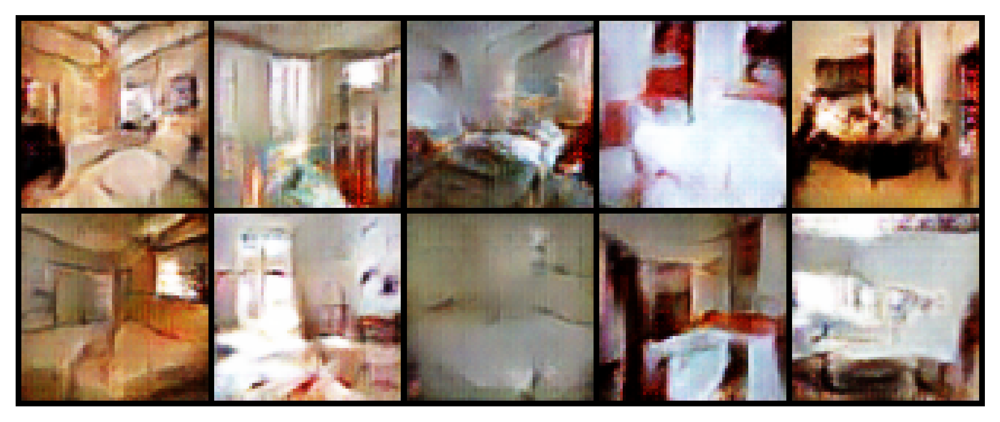

Training epoch complete in 28m 5s
Training epoch complete in 32m 47s
Training epoch complete in 37m 29s
Training epoch complete in 42m 14s
Training epoch complete in 47m 1s
[10/100]	Loss_D: 0.7087	Loss_G: 1.7761	Fretchet_Distance: 147.9720


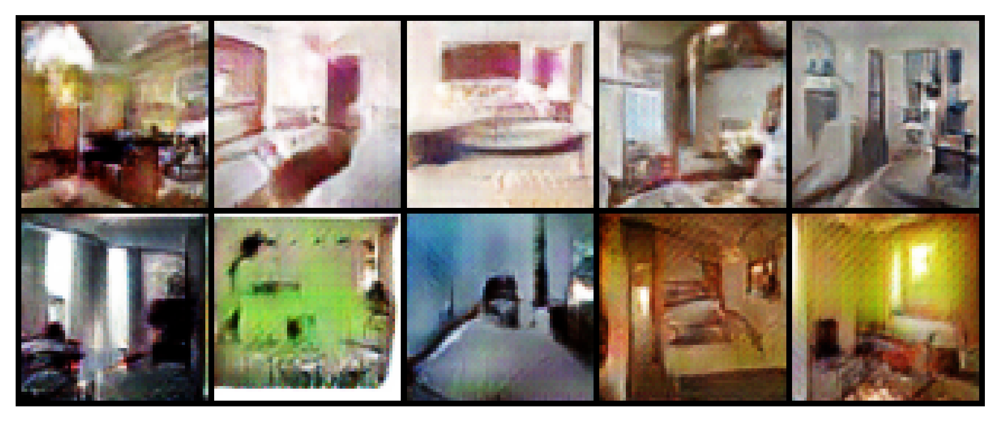

Training epoch complete in 51m 47s
Training epoch complete in 56m 32s
Training epoch complete in 61m 19s
Training epoch complete in 66m 4s
Training epoch complete in 70m 49s
[15/100]	Loss_D: 1.1701	Loss_G: 0.6021	Fretchet_Distance: 144.0734


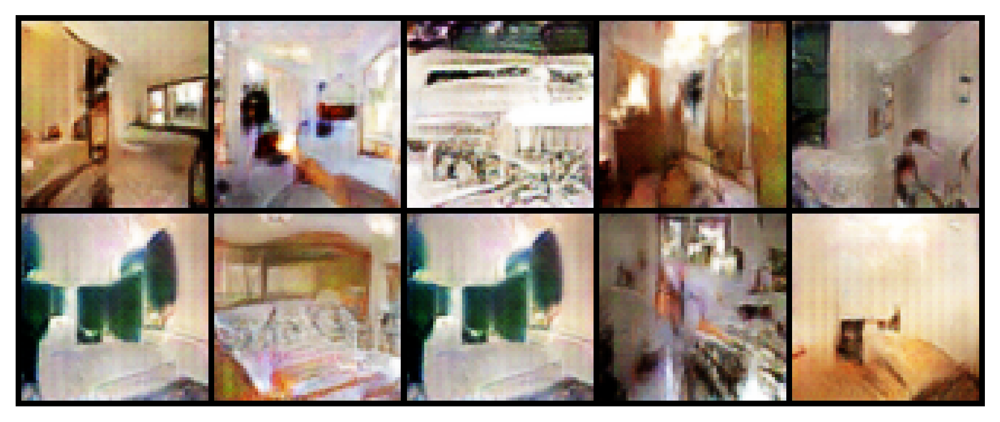

Training epoch complete in 75m 33s
Training epoch complete in 80m 13s
Training epoch complete in 84m 56s
Training epoch complete in 89m 40s
Training epoch complete in 94m 25s
[20/100]	Loss_D: 1.0552	Loss_G: 0.5399	Fretchet_Distance: 142.8258


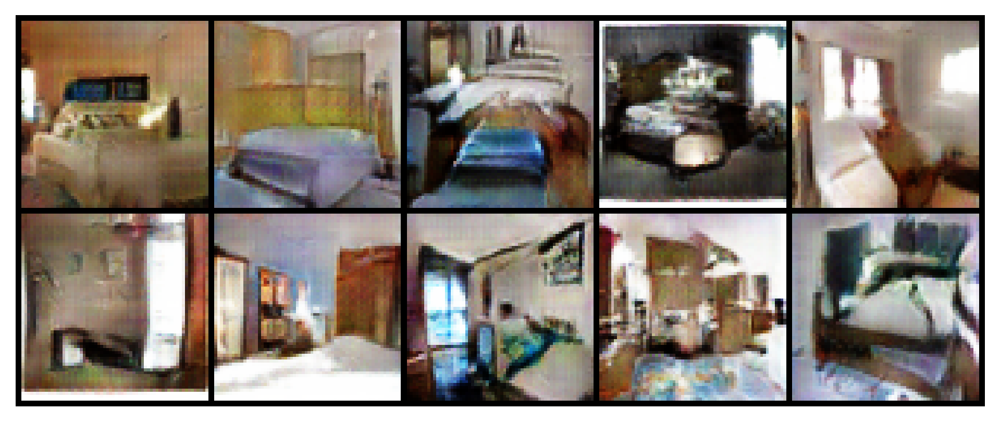

Training epoch complete in 99m 9s
Training epoch complete in 103m 52s
Training epoch complete in 108m 33s
Training epoch complete in 113m 14s
Training epoch complete in 117m 55s
[25/100]	Loss_D: 0.7082	Loss_G: 1.7282	Fretchet_Distance: 127.9562


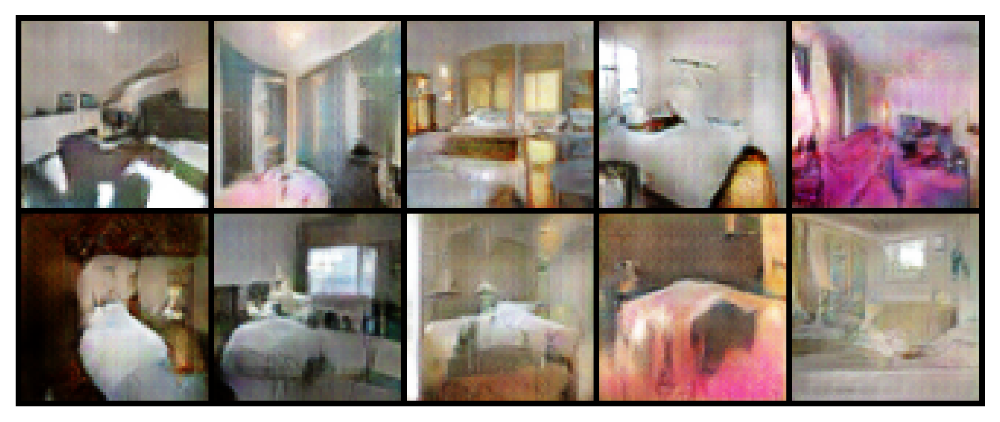

Training epoch complete in 122m 38s
Training epoch complete in 127m 21s
Training epoch complete in 132m 4s
Training epoch complete in 136m 49s
Training epoch complete in 141m 31s
[30/100]	Loss_D: 0.6883	Loss_G: 2.7166	Fretchet_Distance: 136.4166


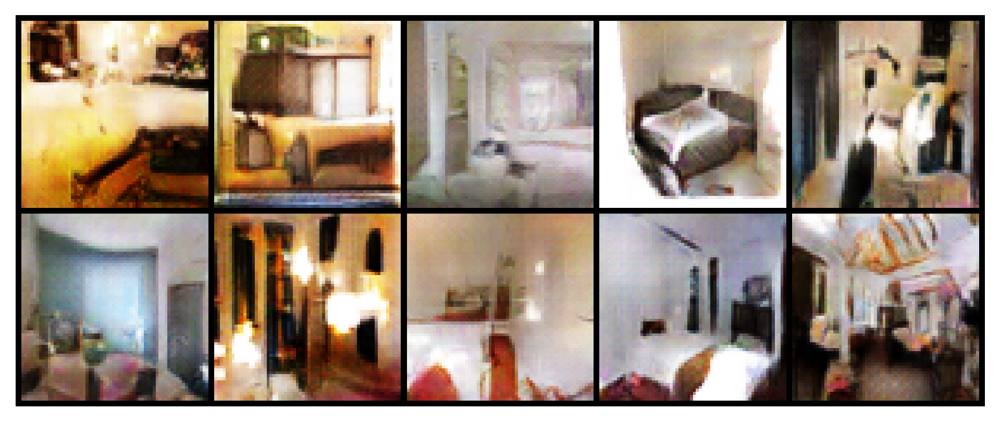

Training epoch complete in 146m 14s
Training epoch complete in 150m 57s
Training epoch complete in 155m 39s
Training epoch complete in 160m 21s
Training epoch complete in 165m 9s
[35/100]	Loss_D: 0.7453	Loss_G: 1.0502	Fretchet_Distance: 131.6846


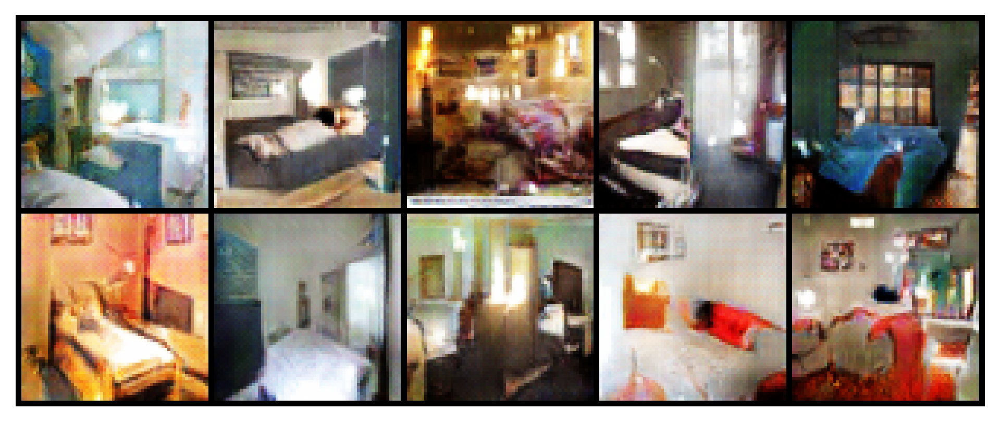

Training epoch complete in 169m 53s
Training epoch complete in 174m 38s
Training epoch complete in 179m 23s
Training epoch complete in 184m 9s
Training epoch complete in 188m 56s
[40/100]	Loss_D: 0.6738	Loss_G: 2.2160	Fretchet_Distance: 136.1453


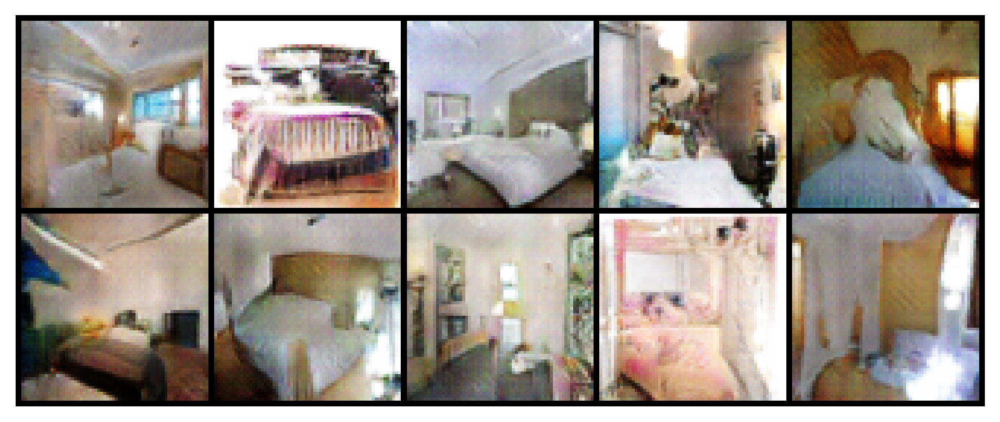

Training epoch complete in 193m 46s
Training epoch complete in 198m 31s
Training epoch complete in 203m 16s
Training epoch complete in 208m 4s
Training epoch complete in 212m 49s
[45/100]	Loss_D: 1.2287	Loss_G: 1.0515	Fretchet_Distance: 145.9937


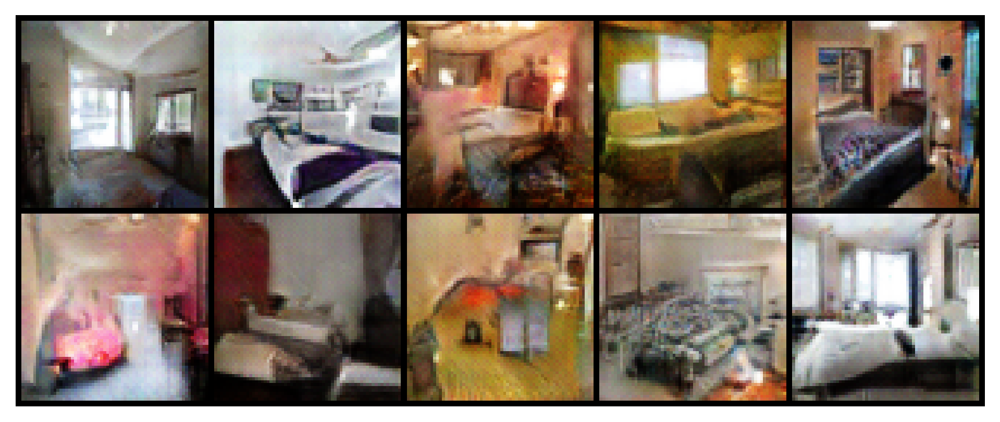

Training epoch complete in 217m 37s
Training epoch complete in 222m 24s
Training epoch complete in 227m 11s
Training epoch complete in 232m 2s
Training epoch complete in 236m 53s
[50/100]	Loss_D: 0.6726	Loss_G: 2.3816	Fretchet_Distance: 131.9490


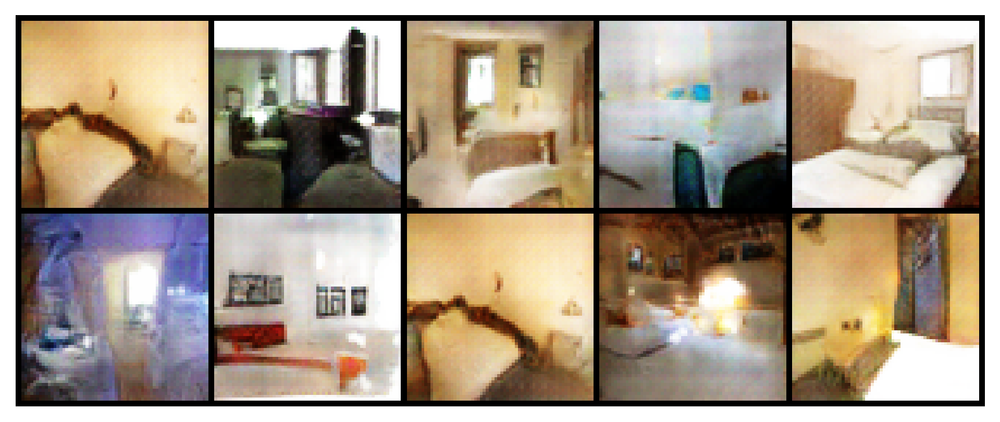

Training epoch complete in 241m 43s
Training epoch complete in 246m 33s
Training epoch complete in 251m 20s
Training epoch complete in 256m 8s
Training epoch complete in 260m 54s
[55/100]	Loss_D: 0.6704	Loss_G: 2.7315	Fretchet_Distance: 140.5742


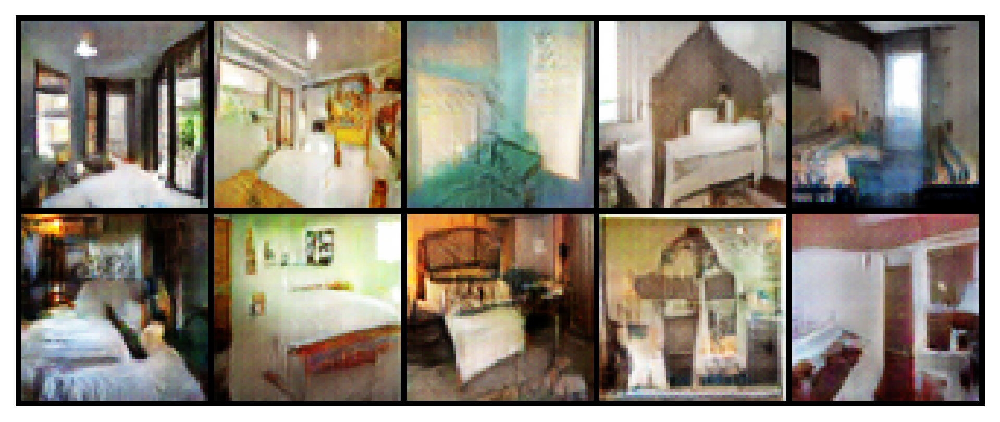

Training epoch complete in 265m 39s
Training epoch complete in 270m 23s
Training epoch complete in 275m 8s
Training epoch complete in 279m 53s
Training epoch complete in 284m 37s
[60/100]	Loss_D: 0.6838	Loss_G: 2.2674	Fretchet_Distance: 134.1461


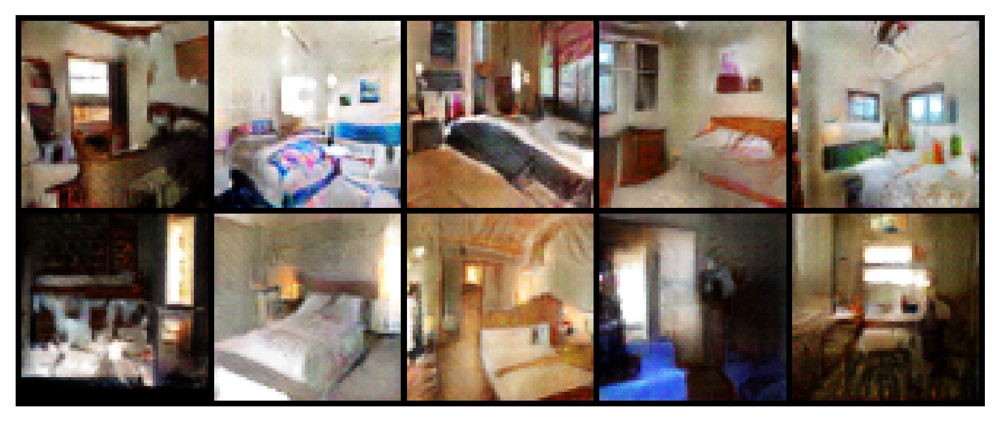

Training epoch complete in 289m 21s
Training epoch complete in 294m 7s
Training epoch complete in 298m 50s
Training epoch complete in 303m 33s
Training epoch complete in 308m 16s
[65/100]	Loss_D: 0.7346	Loss_G: 3.1396	Fretchet_Distance: 133.6899


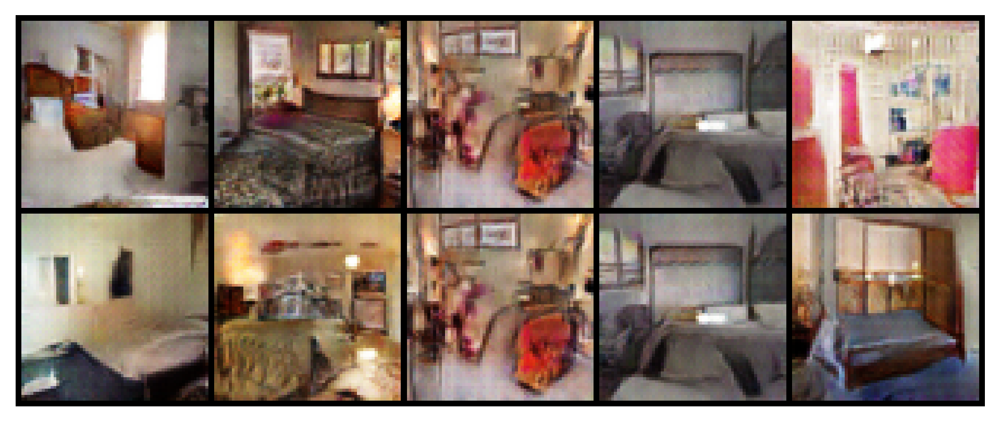

Training epoch complete in 313m 3s
Training epoch complete in 317m 48s
Training epoch complete in 322m 34s
Training epoch complete in 327m 19s
Training epoch complete in 332m 4s
[70/100]	Loss_D: 0.6740	Loss_G: 1.6788	Fretchet_Distance: 137.3401


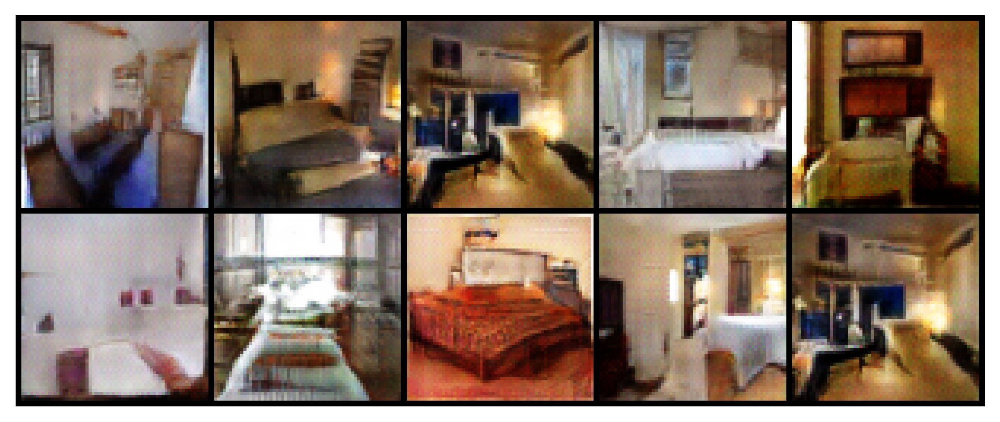

Training epoch complete in 336m 53s
Training epoch complete in 341m 37s
Training epoch complete in 346m 23s
Training epoch complete in 351m 9s
Training epoch complete in 355m 56s
[75/100]	Loss_D: 0.7649	Loss_G: 1.0916	Fretchet_Distance: 136.5131


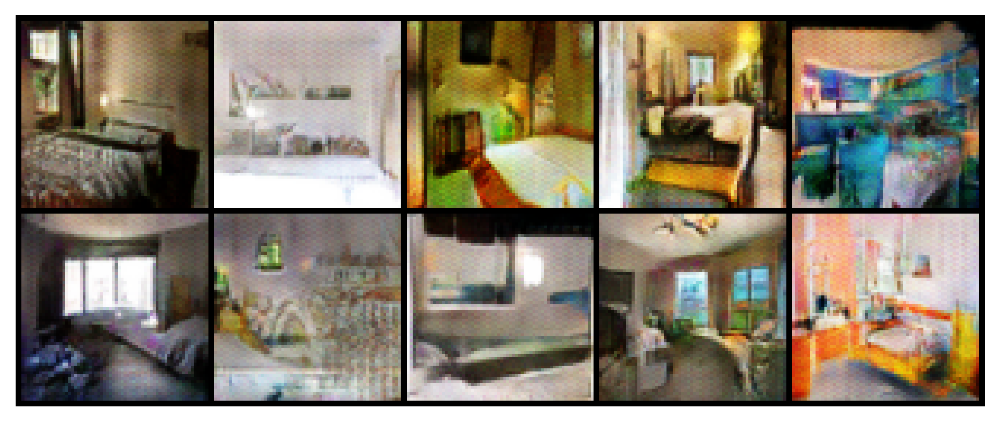

Training epoch complete in 360m 43s
Training epoch complete in 365m 29s
Training epoch complete in 370m 15s
Training epoch complete in 375m 1s
Training epoch complete in 379m 47s
[80/100]	Loss_D: 0.6859	Loss_G: 2.1383	Fretchet_Distance: 126.1199


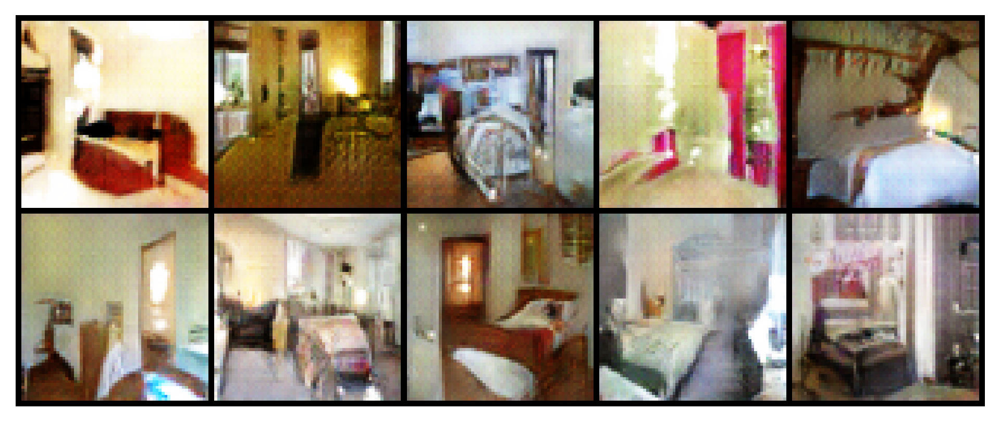

Training epoch complete in 384m 33s
Training epoch complete in 389m 18s
Training epoch complete in 394m 3s
Training epoch complete in 398m 47s
Training epoch complete in 403m 34s
[85/100]	Loss_D: 0.7035	Loss_G: 3.4321	Fretchet_Distance: 128.7180


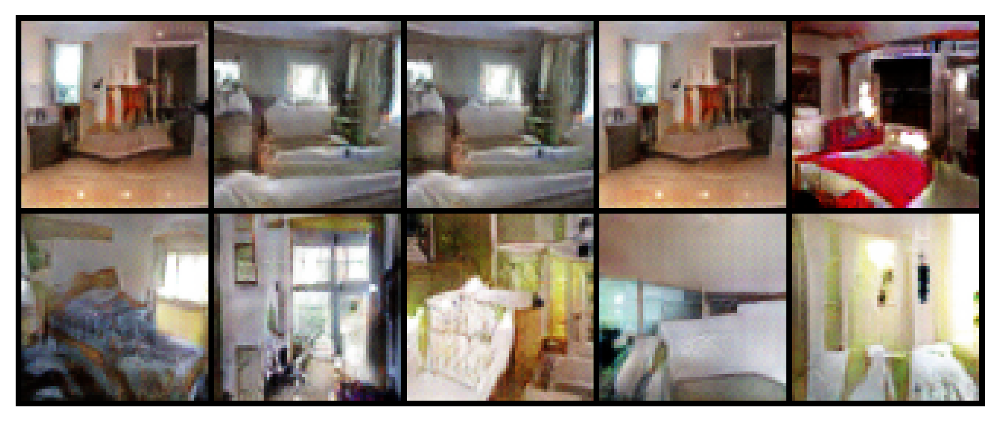

Training epoch complete in 408m 20s
Training epoch complete in 413m 9s
Training epoch complete in 417m 54s
Training epoch complete in 422m 40s
Training epoch complete in 427m 27s
[90/100]	Loss_D: 0.7094	Loss_G: 3.4002	Fretchet_Distance: 136.9300


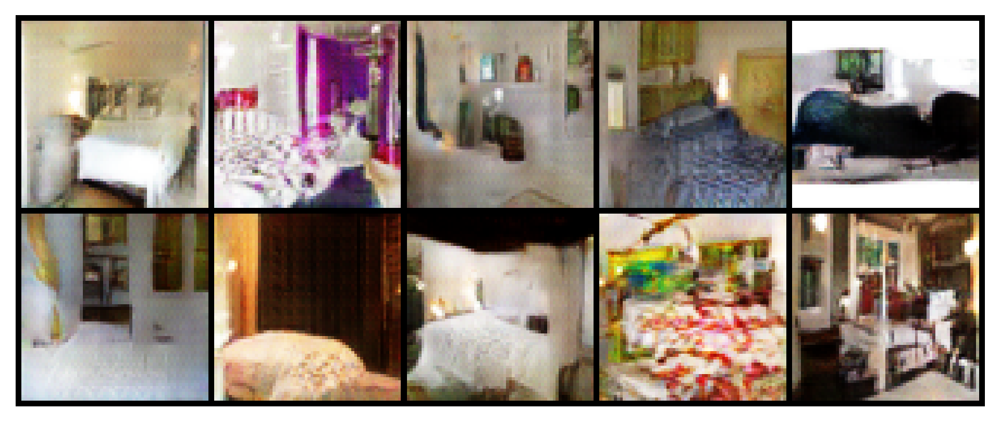

Training epoch complete in 432m 14s
Training epoch complete in 437m 0s
Training epoch complete in 441m 46s
Training epoch complete in 446m 33s
Training epoch complete in 451m 19s
[95/100]	Loss_D: 0.6803	Loss_G: 2.7822	Fretchet_Distance: 126.5244


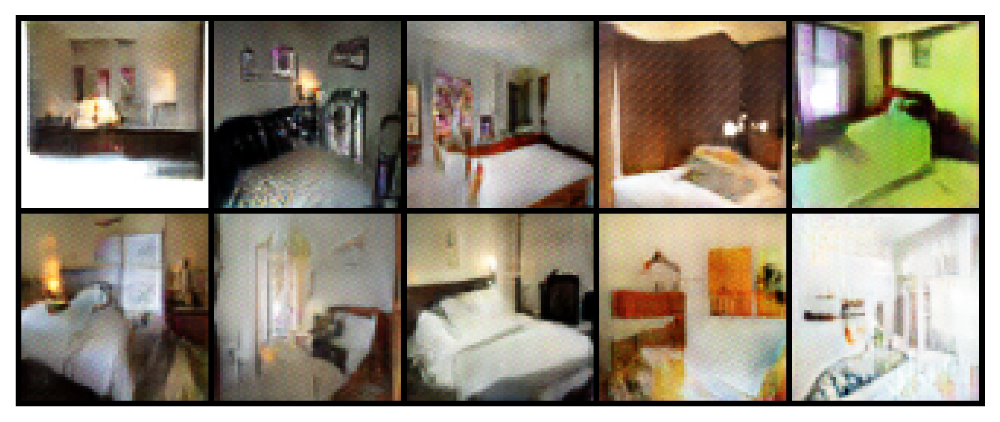

Training epoch complete in 456m 1s
Training epoch complete in 460m 45s
Training epoch complete in 465m 27s
Training epoch complete in 470m 9s
Training epoch complete in 474m 52s
[100/100]	Loss_D: 0.6751	Loss_G: 2.7930	Fretchet_Distance: 130.0450


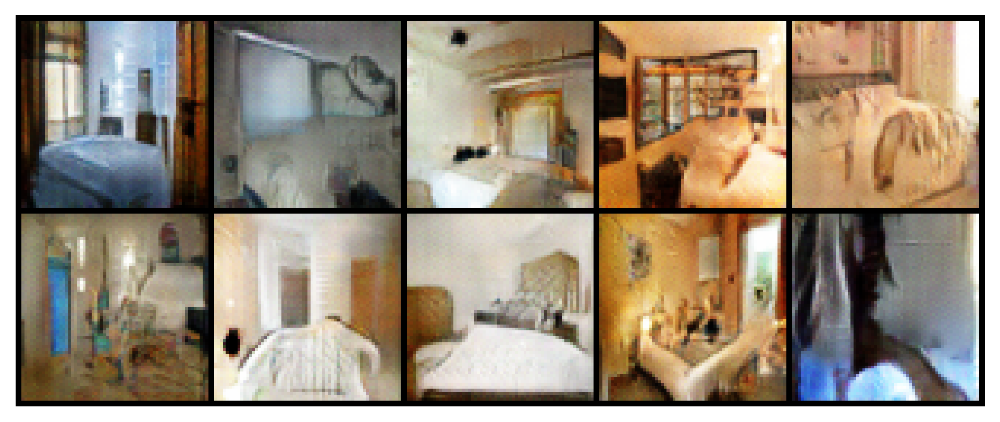

Training complete in 475m 2s


In [ ]:
img_list = []
G_losses = []
D_losses = []
iters = 0
since = time.time()
print("Starting Training Loop...")
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(train_loader, 0):
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
#         # add some noise to the input to discriminator
        
        real_cpu=0.9*real_cpu+0.1*torch.randn((real_cpu.size()), device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        
        fake=0.9*fake+0.1*torch.randn((fake.size()), device=device)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        D_G_z2 = output.mean().item()
        
        # Calculate gradients for G
        errG.backward()
        # Update G
        optimizerG.step()
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(train_loader)-1)):
            with torch.no_grad():
                fixed_noise = torch.randn(ngf, nz, 1, 1, device=device)
                fake_display = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake_display, padding=2, normalize=True))
            
         
            
        iters += 1  
    time_elapsed = time.time() - since
    print('Training epoch complete in {:.0f}m {:.0f}s'.format(time_elapsed //
                                                        60, time_elapsed % 60)) 
    G_losses.append(errG.item())
    D_losses.append(errD.item())
    for image, _ in val_loader:  
        images = image.to(device)
        break
    images = 0.9*images+0.1*torch.randn((images.size()), device=device)    
    fretchet_dist=calculate_fretchet(images,fake,model) 
    if ((epoch+1)%5==0):
        
        print('[%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tFretchet_Distance: %.4f'
                      % (epoch+1, num_epochs,
                         errD.item(), errG.item(),fretchet_dist))
        
        
        plt.figure(figsize=(8,8))
        plt.axis("off")
        pictures=vutils.make_grid(fake_display[torch.randint(len(fake_display), (10,))],nrow=5,padding=2, normalize=True)
        plt.imshow(np.transpose(pictures,(1,2,0)))
        plt.show()
time_elapsed = time.time() - since
print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed //
                                                    60, time_elapsed % 60))

## Results

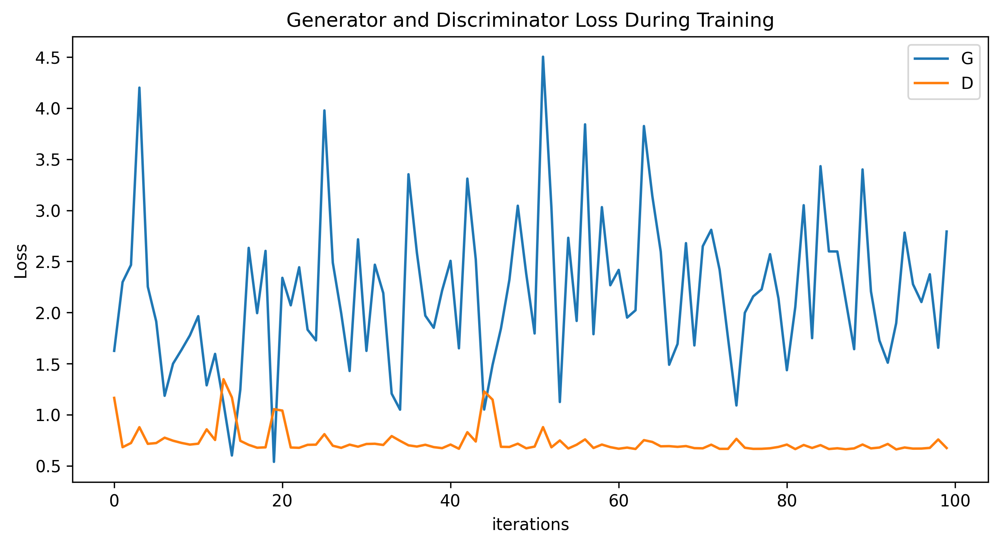

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

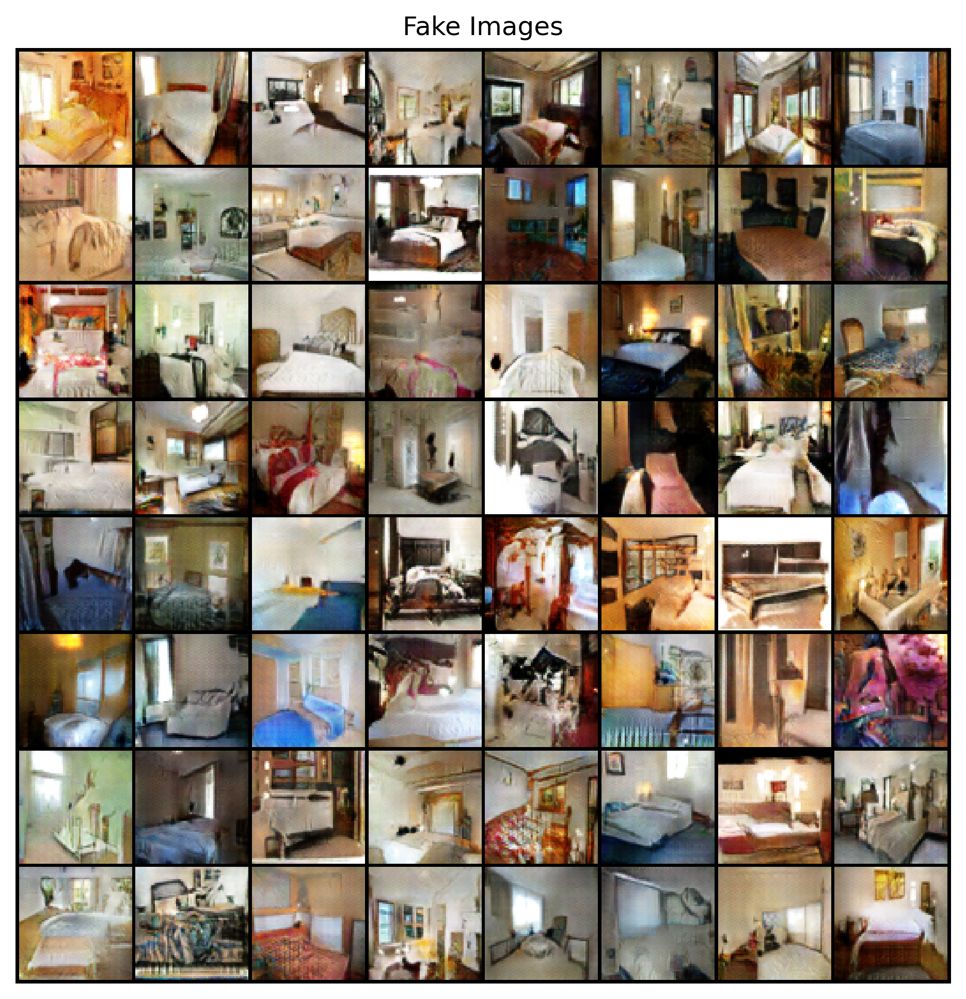

In [ ]:
# Plot genearted images
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [ ]:
# Generator saving
model_save_name = 'netG1.pth'
path = f"/content/drive/MyDrive/{model_save_name}" 
torch.save(netG.state_dict(), path)

# Discriminator saving
model_save_name = 'netD1.pth'
path = f"/content/drive/MyDrive/{model_save_name}" 
torch.save(netD.state_dict(), path)

## Latent vectors

In [ ]:
# Loading model
drive.mount('/content/drive')

model_save_name = 'netG1.pth'
path = f"/content/drive/MyDrive/{model_save_name}" 
netG_loaded = Generator(ngpu).to(device)
netG_loaded.load_state_dict(torch.load(path))
netG_loaded.eval()

Mounted at /content/drive


Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

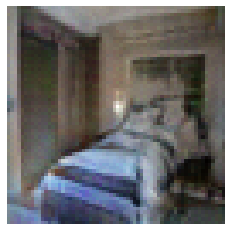

In [ ]:
# vector1
torch.manual_seed(21)
fixed_noise1 = torch.randn(1, nz, 1, 1, device=device)
fake_display = netG_loaded(fixed_noise1).detach().cpu()
plt.figure(figsize=(4,4))
plt.axis("off")
pictures=vutils.make_grid(fake_display, nrow=1,padding=1, normalize=True)
plt.imshow(np.transpose(pictures,(1,2,0)))
plt.show()

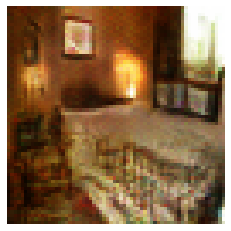

In [ ]:
# vector2
torch.manual_seed(36)
fixed_noise2 = torch.randn(1, nz, 1, 1, device=device)
fake_display = netG_loaded(fixed_noise2).detach().cpu()
plt.figure(figsize=(4,4))
plt.axis("off")
pictures=vutils.make_grid(fake_display, nrow=1,padding=1, normalize=True)
plt.imshow(np.transpose(pictures,(1,2,0)))
plt.show()

In [ ]:
# interpolated vectors
vectors = []
vectors.append(fixed_noise1)
for i in range(1,9):
    vectors.append(((9-i)/(9)) * fixed_noise1 + ((i)/(9)) * fixed_noise2)

vectors.append(fixed_noise2)

/usr/local/lib/python3.7/dist-packages/torch/tensor.py:474: UserWarning: non-inplace resize is deprecated
  warnings.warn("non-inplace resize is deprecated")


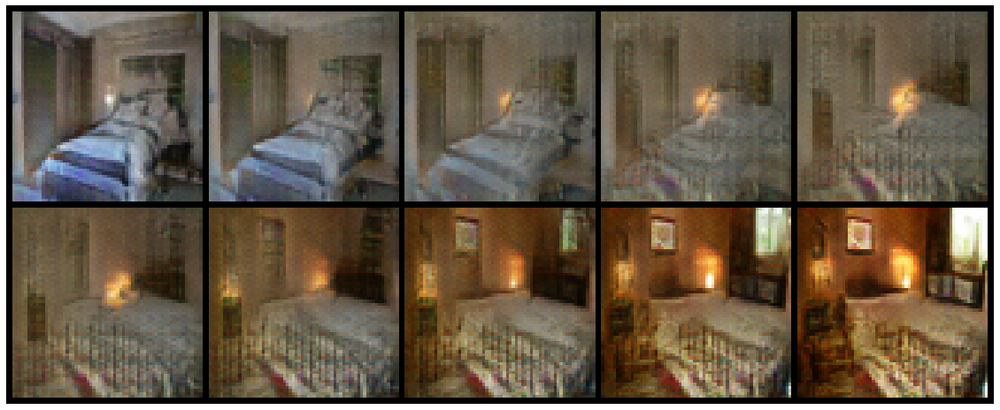

In [ ]:
# Printing results
v_len = len(vectors)
vectors_t = torch.stack(vectors).resize(v_len,nz,1,1)
fake_display = netG_loaded(vectors_t).detach().cpu()
plt.figure(figsize=(20,20))
plt.axis("off")
pictures=vutils.make_grid(fake_display, nrow=5,padding=2, normalize=True)
plt.imshow(np.transpose(pictures,(1,2,0)))
plt.show()

## WGAN

In [ ]:
# What are wgans --> https://machinelearningmastery.com/how-to-code-a-wasserstein-generative-adversarial-network-wgan-from-scratch/

### Data

In [ ]:
# Parameters
train_input_root = './lsun/bedroom'
batch_size = 128
workers = 2
clamp_num = 0.01 # clip gradient for critic

transform = transforms.Compose(
    [transforms.Resize((64,64)),
     transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

dataset = ImageDataset(
        folder_path=train_input_root,
        transform=transform)

validation_split = .2
shuffle_dataset = True
random_seed= 42

# Creating data indices for training and validation splits:
dataset_size = len(dataset)
indices = list(range(dataset_size))
split = int(np.floor(validation_split * dataset_size))
if shuffle_dataset :
    np.random.seed(random_seed)
    np.random.shuffle(indices)
train_indices, val_indices = indices[split:], indices[:split]

# Creating PT data samplers and loaders:
train_sampler = SubsetRandomSampler(train_indices)
valid_sampler = SubsetRandomSampler(val_indices)

train_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, 
                                           sampler=train_sampler, num_workers=2)

val_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                                sampler=valid_sampler,
                                                num_workers=2)


# Checking the train dataset
for image, _ in train_loader:  
    print('Train image batch dimensions:', image.shape)
    break

# Checking the valid dataset
for image, _ in val_loader:  
    print('Validation image batch dimensions:', image.shape)
    break

Train image batch dimensions: torch.Size([128, 3, 64, 64])
Validation image batch dimensions: torch.Size([128, 3, 64, 64])


### Parameters

In [ ]:
SEED=42
random.seed(SEED)
torch.manual_seed(SEED)
# Spatial size of training images. All images will be resized to this size using a transformer.
image_size = 64
# Number of channels in the training images. For color images this is 3
nc = 3
# Size of z latent vector (i.e. size of generator input)
nz = 100 # noise dimension
# Size of feature maps in generator
ngf = 64
# Size of feature maps in discriminator
ndf = 64
# Number of training epochs
num_epochs = 100
# different Learning rate for optimizers
g_lr = 0.0001
d_lr = 0.0004
# Beta1 hyperparam for Adam optimizers
beta1 = 0.5
ngpu=1

### Generator & Discriminator

In [ ]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # added layer - state size. (ngf*2) x 16 x 16
            # nn.ConvTranspose2d( ngf, ngf, 4, 2, 1, bias=False),
            # nn.BatchNorm2d(ngf),
            # nn.ReLU(True),
            # added layer - state size. (ngf*2) x 16 x 16
            # nn.ConvTranspose2d( ngf, ngf, 4, 2, 1, bias=False),
            # nn.BatchNorm2d(ngf),
            # nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
class DiscriminatorWGAN(nn.Module):
    def __init__(self, ngpu):
        super().__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # added layer (nc) x 256 x256
            # nn.Conv2d(nc, nc, 4, 4, 1, bias=False),
            # nn.LeakyReLU(0.2, inplace=True),
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            # nn.Sigmoid()
            # no sigmoid cuz it's WGAN
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
def weight_init(m):
    # weight_initialization: important for wgan!
    class_name=m.__class__.__name__
    if class_name.find('Conv')!=-1:
        m.weight.data.normal_(0,0.02)
    elif class_name.find('Norm')!=-1:
        m.weight.data.normal_(1.0,0.02)
#     else:print(class_name)

In [ ]:
genWGAN = Generator(ngpu).to(device)
disWGAN = DiscriminatorWGAN(ngpu).to(device)

print(genWGAN)
print(disWGAN)

genWGAN.apply(weight_init)
disWGAN.apply(weight_init)

# Optimizers
optimizerD = RMSprop(genWGAN.parameters(),lr=d_lr ) 
optimizerG = RMSprop(disWGAN.parameters(),lr=g_lr )


Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


## Learning

In [ ]:
fix_noise = Variable(torch.FloatTensor(batch_size, nz,1,1).normal_(0,1))
fix_noise = fix_noise.cuda()
netd.cuda()
netg.cuda()

NameError: ignored

In [ ]:
# begin training
print('begin training, be patient...')
one=t.FloatTensor([1])
mone=-1*one

for epoch in range(opt.max_epoch):
    for ii, data in enumerate(dataloader,0):
        real,_=data
        input = Variable(real)
        noise = t.randn(input.size(0),opt.nz,1,1)
        noise = Variable(noise)
        
        if opt.gpu:
            one = one.cuda()
            mone = mone.cuda()
            noise = noise.cuda()
            input = input.cuda()

        # modification: clip param for discriminator
        for parm in netd.parameters():
                parm.data.clamp_(-opt.clamp_num,opt.clamp_num)
        
        # ----- train netd -----
        netd.zero_grad()
        ## train netd with real img
        output=netd(input)
        output.backward(one)
        ## train netd with fake img
        fake_pic=netg(noise).detach()
        output2=netd(fake_pic)
        output2.backward(mone)
        optimizerD.step()

        
        
        # ------ train netg -------
        # train netd more: because the better netd is,
        # the better netg will be
        if (ii+1)%5 ==0:
            netg.zero_grad()
            noise.data.normal_(0,1)
            fake_pic=netg(noise)
            output=netd(fake_pic)
            output.backward(one)
            optimizerG.step()
            if ii%100==0:pass
    fake_u=netg(fix_noise)
    imgs = make_grid(fake_u.data*0.5+0.5).cpu() # CHW
    plt.imshow(imgs.permute(1,2,0).numpy()) # HWC
    plt.show()

In [ ]:
img_list = []
G_losses = []
D_losses = []
iters = 0
since = time.time()

one=torch.FloatTensor([1])
mone=-1*one

print("Starting Training Loop...")
for epoch in range(num_epochs):

    # For each batch in the dataloader
    for i, data in enumerate(train_loader, 0):
        
        ## Train with all-real batch

        disWGAN.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
#         # add some noise to the input to discriminator
        
        real_cpu=0.9*real_cpu+0.1*torch.randn((real_cpu.size()), device=device)
        # Forward pass real batch through D
        output = disWGAN(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        
        fake=0.9*fake+0.1*torch.randn((fake.size()), device=device)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        D_G_z2 = output.mean().item()
        
        # Calculate gradients for G
        errG.backward()
        # Update G
        optimizerG.step()
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(train_loader)-1)):
            with torch.no_grad():
                fixed_noise = torch.randn(ngf, nz, 1, 1, device=device)
                fake_display = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake_display, padding=2, normalize=True))
            
         
            
        iters += 1  
    time_elapsed = time.time() - since
    print('Training epoch complete in {:.0f}m {:.0f}s'.format(time_elapsed //
                                                        60, time_elapsed % 60)) 
    G_losses.append(errG.item())
    D_losses.append(errD.item())
    for image, _ in val_loader:  
        images = image.to(device)
        break
    images = 0.9*images+0.1*torch.randn((images.size()), device=device)    
    fretchet_dist=calculate_fretchet(images,fake,model) 

    if ((epoch+1)%5==0):
        
        print('[%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tFretchet_Distance: %.4f'
                      % (epoch+1, num_epochs,
                         errD.item(), errG.item(),fretchet_dist))
        
        
        plt.figure(figsize=(8,8))
        plt.axis("off")
        pictures=vutils.make_grid(fake_display[torch.randint(len(fake_display), (10,))],nrow=5,padding=2, normalize=True)
        plt.imshow(np.transpose(pictures,(1,2,0)))
        plt.show()
time_elapsed = time.time() - since
print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed //
                                                    60, time_elapsed % 60))

Starting Training Loop...


NameError: ignored